<a href="https://colab.research.google.com/github/ynewman8/Spiny-vs.-Aspiny-Neuron-Classification/blob/main/NN_Final_Project_Yoni_David.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Part 1


In [231]:
!pip3 install tensorflow[and-cuda]

In [232]:
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d
from scipy.stats import norm
from sklearn import metrics
from sklearn import decomposition
from sklearn import manifold
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, recall_score, f1_score, confusion_matrix, classification_report, roc_curve, roc_auc_score, precision_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error
from numpy import sign
from scipy.optimize import root_scalar
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, LabelBinarizer, LabelEncoder
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.layers import Dropout

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data
import torchvision.datasets as dataset
import torchvision.transforms as transforms
from tqdm.notebook import trange, tqdm
import copy
import random
import time

from scipy.stats import ttest_rel
from statsmodels.stats.contingency_tables import mcnemar
from sklearn.linear_model import Perceptron


In [233]:
# Mounting drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [234]:
# Loading then data
data = np.load("/content/drive/MyDrive/David_and_Yoni/Neural Networks/Final Project/neurodata.npy")
sample_freq = 50000

## Part 1 - Q2

In [235]:
#Extracting useful data
electrical_stimulus  = data[0]
spiny_response = data[1]
aspiny_response = data[2]
time = np.arange(len(electrical_stimulus)) / sample_freq

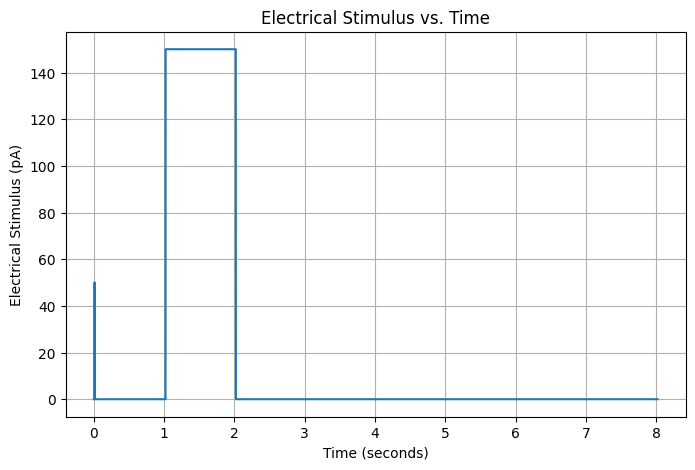

In [236]:
# Plotting the electrical stimulus vs. time
plt.figure(figsize=(8, 5))
plt.plot(time, electrical_stimulus)
plt.title('Electrical Stimulus vs. Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrical Stimulus (pA)')
plt.grid(True)
plt.show()

## Part 1 - Q3

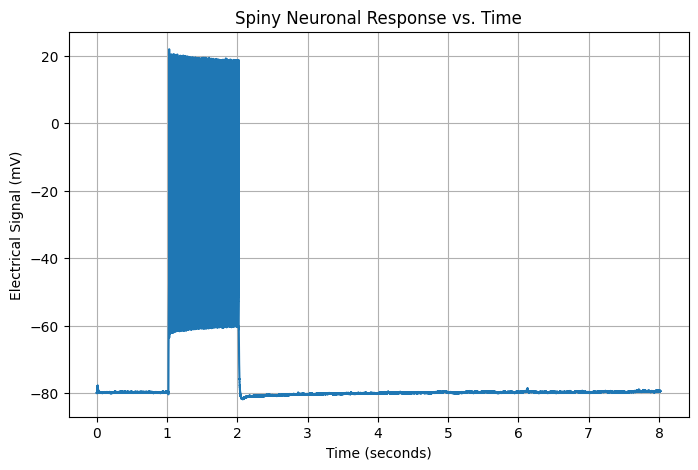

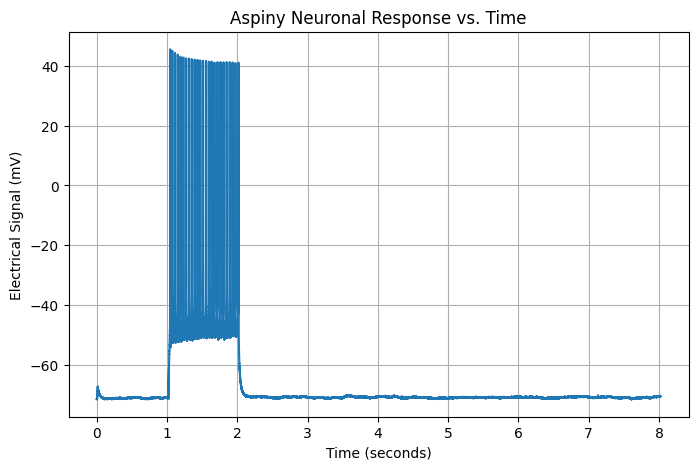

In [237]:
# Plotting the electrical stimulus vs. time
plt.figure(figsize=(8, 5))
plt.plot(time, spiny_response)
plt.title('Spiny Neuronal Response vs. Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrical Signal (mV)')
plt.grid(True)
plt.show()

# Plotting the electrical stimulus vs. time
plt.figure(figsize=(8, 5))
plt.plot(time, aspiny_response)
plt.title('Aspiny Neuronal Response vs. Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrical Signal (mV)')
plt.grid(True)
plt.show()

## Part 1 - Q4

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.10/dist-packages/matplotlib/pyplot.py'>

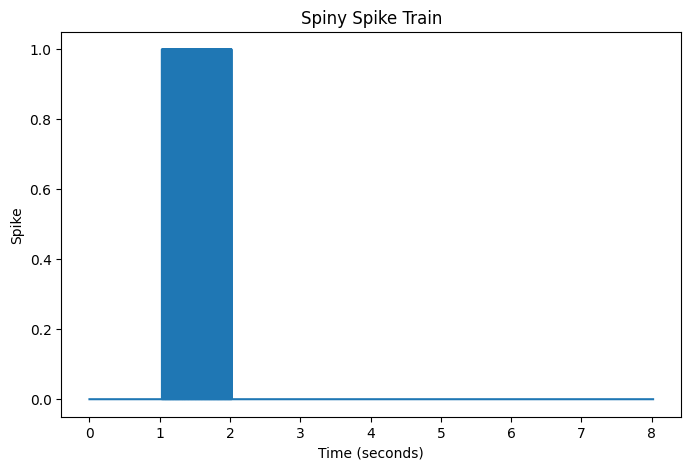

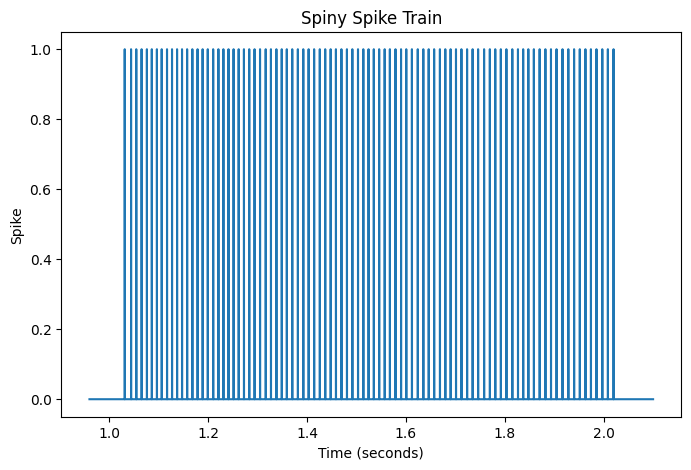

In [238]:
# Spiny response spike train
peaks, _ = find_peaks(spiny_response, height=15)
spiny_response_binary = np.zeros_like(spiny_response)
spiny_response_binary[peaks] = 1

# Plot spiny spike train
plt.figure(figsize=(8, 5))
plt.plot(time, spiny_response_binary, label='Spiny Spike Train')
plt.title('Spiny Spike Train')
plt.xlabel('Time (seconds)')
plt.ylabel('Spike')
plt

# Plot spiny spike train zoomed into 1-2 sec
plt.figure(figsize=(8, 5))
plt.plot(time[48000:105000], spiny_response_binary[48000:105000], label='Spiny Spike Train')
plt.title('Spiny Spike Train')
plt.xlabel('Time (seconds)')
plt.ylabel('Spike')
plt

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.10/dist-packages/matplotlib/pyplot.py'>

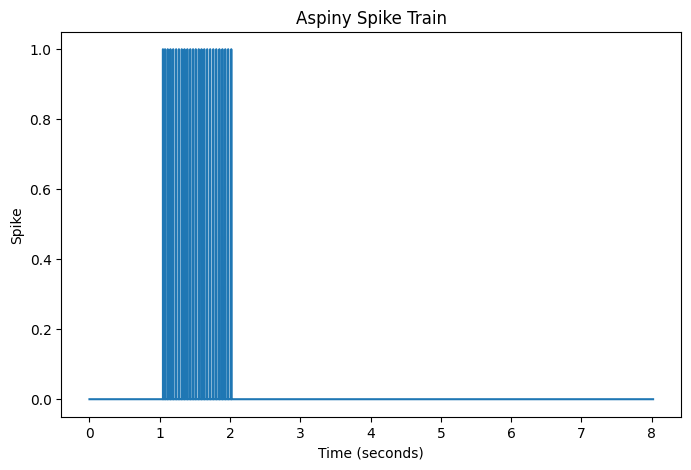

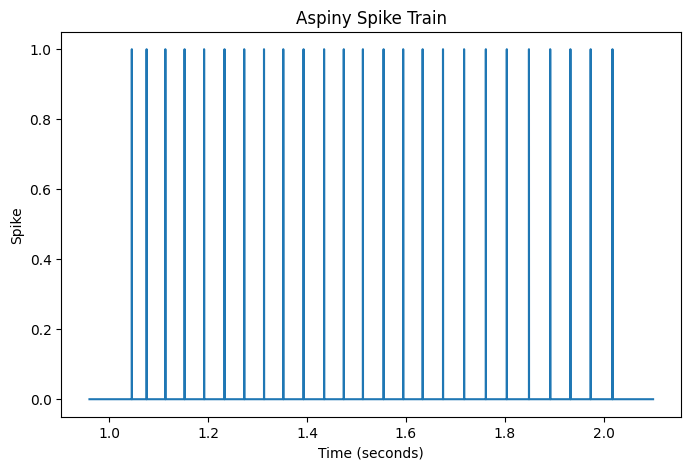

In [239]:
# Aspiny response spike train
peaks_as, _ = find_peaks(aspiny_response, height=35)
aspiny_response_binary = np.zeros_like(aspiny_response)
aspiny_response_binary[peaks_as] = 1

# Plot aspiny spike train
plt.figure(figsize=(8,5))
plt.plot(time, aspiny_response_binary, label='Aspiny Spike Train')
plt.title('Aspiny Spike Train')
plt.xlabel('Time (seconds)')
plt.ylabel('Spike')
plt

# Plot aspiny spike train zoomed into 1-2 sec
plt.figure(figsize=(8,5))
plt.plot(time[48000:105000], aspiny_response_binary[48000:105000], label='Aspiny Spike Train')
plt.title('Aspiny Spike Train')
plt.xlabel('Time (seconds)')
plt.ylabel('Spike')
plt

## Part 1 - Q5

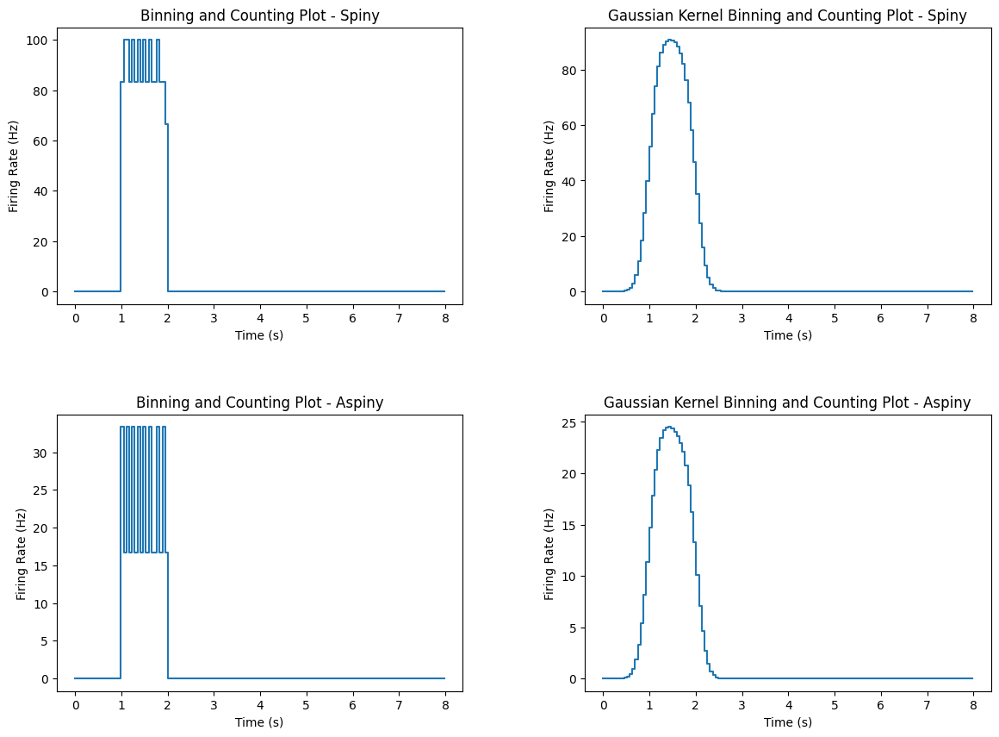

In [240]:
# Bin parameters
bin_size = 3000  #60 miliseconds per bin
time = np.arange(0, 401000, bin_size)
time_sec = time / sample_freq

# Function to compute firing rate and smoothed firing rate
def compute_firing_rate(response_binary, bin_size, sample_freq):
    bin_counts = []
    for i in range(0, len(response_binary), bin_size):
        bin_counts.append(np.sum(response_binary[i:i + bin_size - 1]))
    firing_rate = np.array(bin_counts) * sample_freq / bin_size
    window_size = int(0.2 * sample_freq / bin_size)
    smooth_firing_rate = gaussian_filter1d(firing_rate, sigma=window_size)
    return firing_rate, smooth_firing_rate

# Compute for spiny neurons
spiny_firing_rate, spiny_smooth_firing_rate = compute_firing_rate(spiny_response_binary, bin_size, sample_freq)

# Compute for aspiny neurons
aspiny_firing_rate, aspiny_smooth_firing_rate = compute_firing_rate(aspiny_response_binary, bin_size, sample_freq)

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
plt.subplots_adjust(hspace=0.4, wspace=0.3)  # Adjust spacing between subplots

# Plot for spiny firing rate
axs[0, 0].step(time_sec, spiny_firing_rate, where='mid', linestyle='-')
axs[0, 0].set_xlabel('Time (s)')
axs[0, 0].set_ylabel('Firing Rate (Hz)')
axs[0, 0].set_title('Binning and Counting Plot - Spiny')
axs[0, 0].grid(False)

# Plot for smoothed spiny firing rate
axs[0, 1].step(time_sec, spiny_smooth_firing_rate, where='mid', linestyle='-')
axs[0, 1].set_xlabel('Time (s)')
axs[0, 1].set_ylabel('Firing Rate (Hz)')
axs[0, 1].set_title('Gaussian Kernel Binning and Counting Plot - Spiny')
axs[0, 1].grid(False)

# Plot for aspiny firing rate
axs[1, 0].step(time_sec, aspiny_firing_rate, where='mid', linestyle='-')
axs[1, 0].set_xlabel('Time (s)')
axs[1, 0].set_ylabel('Firing Rate (Hz)')
axs[1, 0].set_title('Binning and Counting Plot - Aspiny')
axs[1, 0].grid(False)

# Plot for smoothed aspiny firing rate
axs[1, 1].step(time_sec, aspiny_smooth_firing_rate, where='mid', linestyle='-')
axs[1, 1].set_xlabel('Time (s)')
axs[1, 1].set_ylabel('Firing Rate (Hz)')
axs[1, 1].set_title('Gaussian Kernel Binning and Counting Plot - Aspiny')
axs[1, 1].grid(False)

# Show the figure
plt.show()

## Part 1 - Q6

In [241]:
# Finding the indices where there is an electrical stimulus of 150 pA
indices_150 = np.where(electrical_stimulus == 150)[0]

# Calculate firing rates
spiny_firing_rate = np.sum(spiny_response_binary[indices_150]) / (len(indices_150)) * sample_freq
aspiny_firing_rate = np.sum(aspiny_response_binary[indices_150]) / len(indices_150) * sample_freq

# Print firing rates
print("Spiny firing rate:", spiny_firing_rate, "Hz")
print("Aspiny firing rate:", aspiny_firing_rate, "Hz")

Spiny firing rate: 91.0 Hz
Aspiny firing rate: 25.0 Hz


In [242]:
std_spiny = np.std(spiny_response_binary[indices_150])
std_aspiny = np.std(aspiny_response_binary[indices_150])

print("Standard deviation of spiny response:", std_spiny)
print("Standard deviation of aspiny response:", std_aspiny)

Standard deviation of spiny response: 0.042622622
Standard deviation of aspiny response: 0.022355089


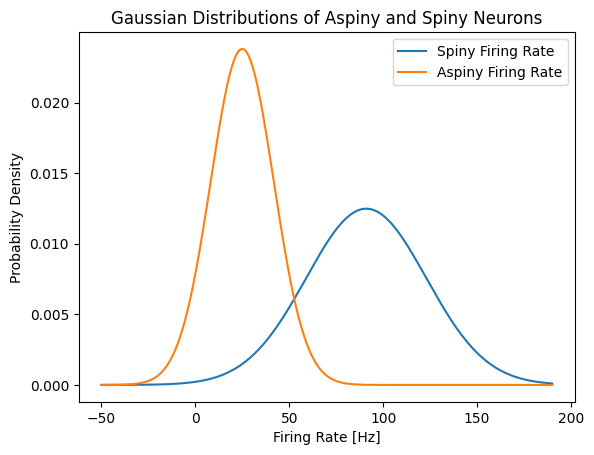

In [243]:
# Parameters
std1 = std_spiny*750
std2 = std_aspiny*750

# Create x-axis values
x = np.linspace(-50, 190, 500)

# Calculate Gaussian distributions
y1 = norm.pdf(x, spiny_firing_rate, std1)
y2 = norm.pdf(x, aspiny_firing_rate, std2)

# Plot
plt.plot(x, y1, label='Spiny Firing Rate')
plt.plot(x, y2, label='Aspiny Firing Rate')
plt.xlabel('Firing Rate [Hz]')
plt.ylabel('Probability Density')
plt.title('Gaussian Distributions of Aspiny and Spiny Neurons')
plt.legend()
plt.show()

In [244]:
d_prime = (spiny_firing_rate - aspiny_firing_rate) / np.sqrt((std1**2 + std2**2) / 2)
print("d':", d_prime)

d': 2.585754787007299


## Part A - Q7

In [245]:
np.random.seed(40)  # For reproducibility
n_samples = 500  # Number of samples

# Generate spiny neuron data
spiny_data = {
    'firing_rate': np.random.normal(spiny_firing_rate, std1, n_samples),
    'label': 1
}

# Generate aspiny neuron data
aspiny_data = {
    'firing_rate': np.random.normal(aspiny_firing_rate, std2, n_samples),
    'label': -1
}

# Convert to DataFrames
df_spiny = pd.DataFrame(spiny_data)
df_aspiny = pd.DataFrame(aspiny_data)

# Combine DataFrames
df = pd.concat([df_spiny, df_aspiny], ignore_index=True)

Intersection point: 52.69


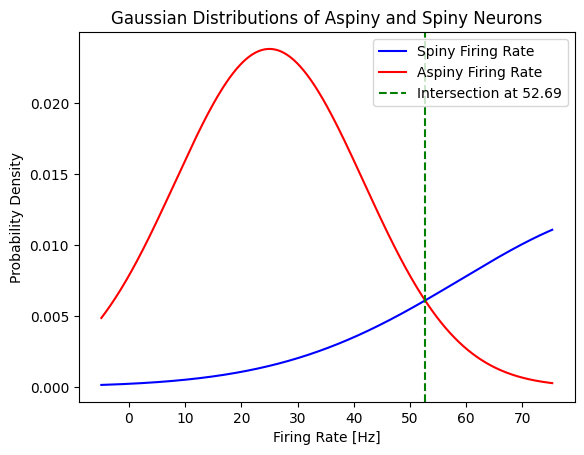

In [246]:
x_guess = 50 #initial guess based on plot above

# Function to calculate the intersection at the x point
def intersect_gauss(x):
    y1 = norm.pdf(x, spiny_firing_rate, std1)
    y2 = norm.pdf(x, aspiny_firing_rate, std2)
    return y1 - y2

result = root_scalar(intersect_gauss, bracket=[x_guess - 10, x_guess + 10], method='brentq')

# Output the result
intersection_point = result.root
print(f"Intersection point: {intersection_point:.2f}")

# Plot for visualization
x = np.linspace(spiny_firing_rate - 3*std1, aspiny_firing_rate + 3*std2, 500)
y1 = norm.pdf(x, spiny_firing_rate, std1)
y2 = norm.pdf(x, aspiny_firing_rate, std2)

plt.plot(x, y1, label='Spiny Firing Rate', color='blue')
plt.plot(x, y2, label='Aspiny Firing Rate', color='red')
plt.axvline(intersection_point, color='green', linestyle='--', label=f'Intersection at {intersection_point:.2f}')
plt.xlabel('Firing Rate [Hz]')
plt.ylabel('Probability Density')
plt.title('Gaussian Distributions of Aspiny and Spiny Neurons')
plt.legend()
plt.show()

In [247]:
# Classify neuron types according to threshold calculated above
z_threshold = intersection_point
df['label_z'] = df['firing_rate'].apply(lambda x: 1 if x > z_threshold else -1)

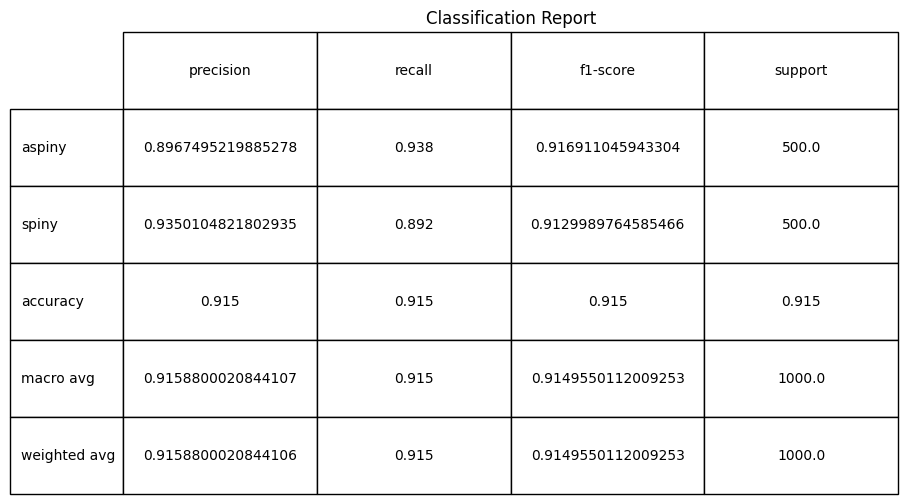

In [248]:
report = classification_report(df['label'], df['label_z'], output_dict=True)

# Convert classification report to DataFrame
report_df = pd.DataFrame(report).transpose()

# Update class labels in the DataFrame
# Assuming '1' is 'spiny' and '-1' is 'aspiny'
report_df.index = report_df.index.map({'1': 'spiny', '-1': 'aspiny', 'accuracy': 'accuracy', 'macro avg': 'macro avg', 'weighted avg': 'weighted avg'})

# Plot the classification report as a table
fig, ax = plt.subplots(figsize=(10, 6))  # Set the size of the figure
ax.axis('off')  # Hide the axes

# Create table
table = ax.table(cellText=report_df.values,
                 rowLabels=report_df.index,
                 colLabels=report_df.columns,
                 cellLoc='center',
                 loc='center',
                 bbox=[0, 0, 1, 1])

# Adjust font size for readability
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1.2, 1.2)  # Scale the table for better visibility

plt.title('Classification Report')
plt.show()

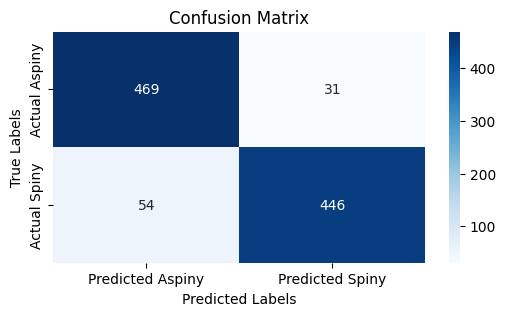

In [249]:
# Generating confusion matrix
cm = confusion_matrix(df['label'], df['label_z'])

#Plotting the confusion_matrix
plt.figure(figsize=(6, 3))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Predicted Aspiny', 'Predicted Spiny'],
            yticklabels=['Actual Aspiny', 'Actual Spiny'])

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

## Part A - Q8

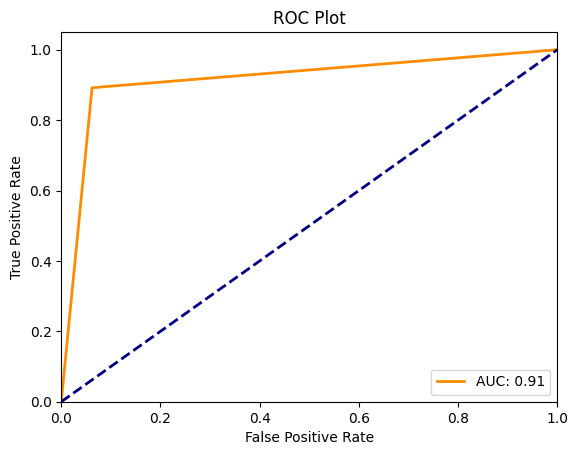

In [250]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(df['label'], df['label_z'])

# Calculate AUC
roc_auc = roc_auc_score(df['label'], df['label_z'])

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='AUC: %0.2f' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Plot')
plt.legend(loc="lower right")
plt.show()

#Part 2

In [251]:
# Loading the data
df_load = pd.read_csv("/content/drive/MyDrive/David_and_Yoni/Neural Networks/Final Project/feat_data.csv")

In [252]:
df_load.head()

,dendrite_type,threshold_v,threshold_i,peak_v,peak_i,trough_v,trough_i,upstroke,upstroke_v,downstroke,...,threshold_v_ramp,threshold_v_short_square,trough_v_long_square,trough_v_ramp,trough_v_short_square,upstroke_downstroke_ratio_long_square,upstroke_downstroke_ratio_ramp,upstroke_downstroke_ratio_short_square,vm_for_sag,vrest
0,aspiny,-33.490959,536.025940,28.835495,537.739807,-55.978970,531.014160,299.764818,-0.535574,-217.133925,...,-33.812500,-43.500002,-59.281254,-57.468754,-75.756252,1.564027,1.304349,1.679550,-87.906258,-74.926987
1,aspiny,-38.694119,463.681763,17.997391,464.439911,-56.637856,462.351837,360.113308,-6.811609,-274.223488,...,-29.187501,-44.046875,-55.875000,-52.515627,-69.109379,1.162618,1.197155,1.369171,-80.156250,-72.042976
2,aspiny,-32.416935,457.616455,22.210737,456.798065,-47.572384,355.919861,210.460299,-2.773237,-52.187941,...,-32.312503,-38.197918,-48.187500,-54.364586,-72.640628,3.379321,4.108774,2.680139,-83.593758,-72.712036
3,aspiny,-30.264706,195.426468,11.924632,195.602936,-48.987133,161.492645,196.672333,-10.977942,-96.910837,...,-36.062601,-41.265626,-48.593754,-54.581137,-63.257814,2.132316,2.867415,2.185564,-87.656250,-62.055580
4,spiny,-37.541275,121.457550,41.824291,121.318398,-53.327831,98.995285,334.820846,3.641510,-91.202334,...,-38.697918,-45.306252,-57.281254,-56.406253,-70.537502,4.059995,4.121745,4.017244,-87.093758,-69.362984


In [253]:
df = df_load.drop(df_load.columns[0], axis=1)
df.head()

,threshold_v,threshold_i,peak_v,peak_i,trough_v,trough_i,upstroke,upstroke_v,downstroke,downstroke_v,...,threshold_v_ramp,threshold_v_short_square,trough_v_long_square,trough_v_ramp,trough_v_short_square,upstroke_downstroke_ratio_long_square,upstroke_downstroke_ratio_ramp,upstroke_downstroke_ratio_short_square,vm_for_sag,vrest
0,-33.490959,536.025940,28.835495,537.739807,-55.978970,531.014160,299.764818,-0.535574,-217.133925,-1.393082,...,-33.812500,-43.500002,-59.281254,-57.468754,-75.756252,1.564027,1.304349,1.679550,-87.906258,-74.926987
1,-38.694119,463.681763,17.997391,464.439911,-56.637856,462.351837,360.113308,-6.811609,-274.223488,-7.690109,...,-29.187501,-44.046875,-55.875000,-52.515627,-69.109379,1.162618,1.197155,1.369171,-80.156250,-72.042976
2,-32.416935,457.616455,22.210737,456.798065,-47.572384,355.919861,210.460299,-2.773237,-52.187941,4.122596,...,-32.312503,-38.197918,-48.187500,-54.364586,-72.640628,3.379321,4.108774,2.680139,-83.593758,-72.712036
3,-30.264706,195.426468,11.924632,195.602936,-48.987133,161.492645,196.672333,-10.977942,-96.910837,-4.700367,...,-36.062601,-41.265626,-48.593754,-54.581137,-63.257814,2.132316,2.867415,2.185564,-87.656250,-62.055580
4,-37.541275,121.457550,41.824291,121.318398,-53.327831,98.995285,334.820846,3.641510,-91.202334,16.553066,...,-38.697918,-45.306252,-57.281254,-56.406253,-70.537502,4.059995,4.121745,4.017244,-87.093758,-69.362984


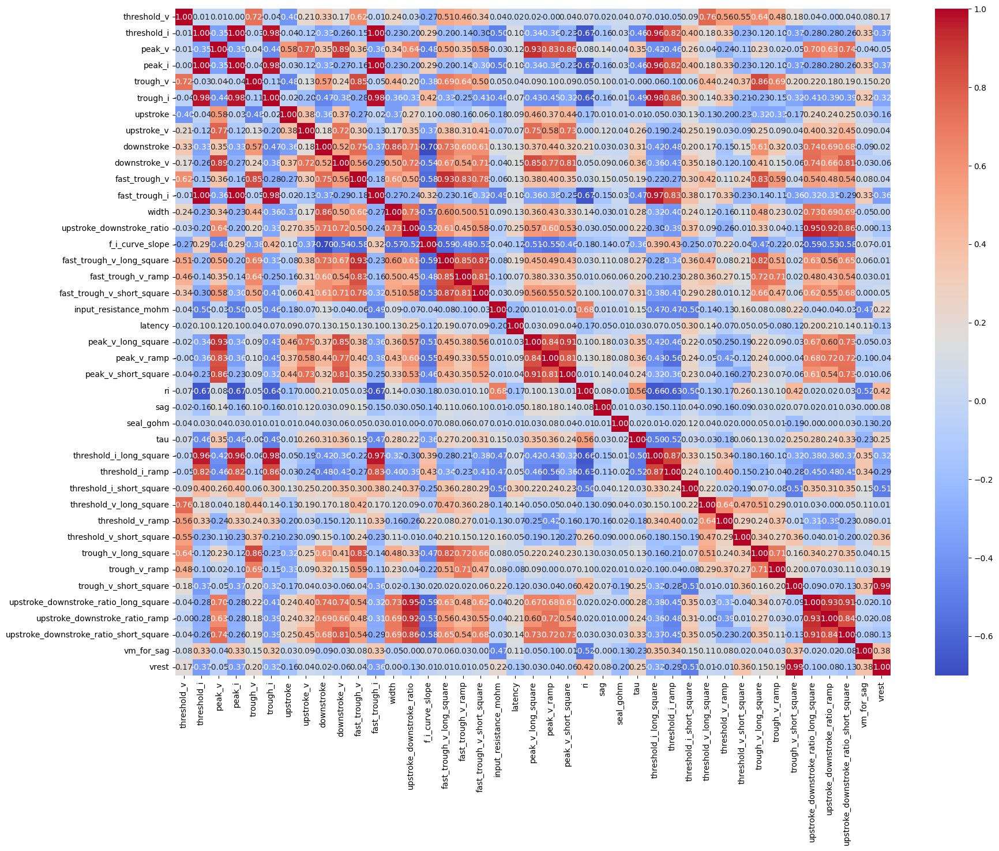

In [254]:
# Before applying PCA we need to make sure our matrix is correlated
correlation_matrix = df.corr()

plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.show()


In [255]:
# Standardizing the features
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Performing PCA to reduce to 3 dimensions
pca = PCA(n_components=3)
df_pca = pca.fit_transform(df_scaled)

# Convert to a DataFrame
df_pca = pd.DataFrame(df_pca, columns=['PC1', 'PC2', 'PC3'])

# Show the result
df_pca.head()

,PC1,PC2,PC3
0,4.734055,2.593494,1.118986
1,6.327115,1.712398,-0.946300
2,0.123892,4.249527,-2.565241
3,-0.241627,-1.218320,-4.136245
4,-4.255693,-0.050060,1.729367


##Q1

### a).

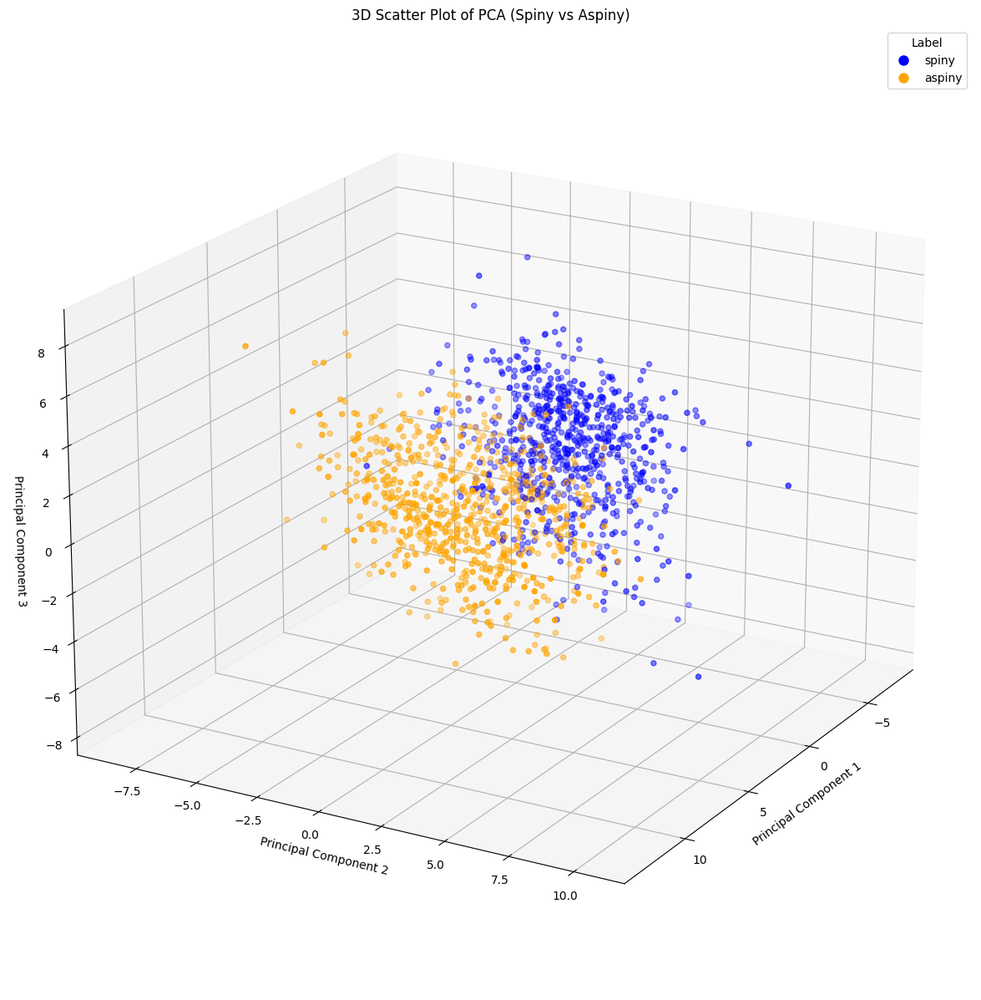

In [256]:
# Extracting labels
labels = df_load.iloc[:, 0]

# Map labels to colors (spiny -> blue, aspiny -> orange)
color_map = {'spiny': 'blue', 'aspiny': 'orange'}
colors = labels.map(color_map)

# Plotting the 3D scatter plot
fig = plt.figure(figsize=(20, 15))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for the three PC's
sc = ax.scatter(df_pca['PC1'], df_pca['PC2'], df_pca['PC3'], c=colors)
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.title('3D Scatter Plot of PCA (Spiny vs Aspiny)')
legend_labels = list(color_map.keys())
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_map[label], markersize=10, label=label) for label in legend_labels]
ax.legend(handles=handles, title='Label')
# Adjusting view
ax.view_init(elev=20, azim=30)
plt.show()

###c).

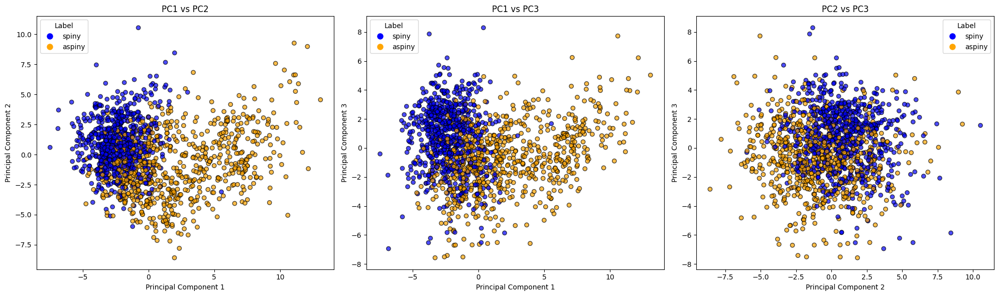

In [257]:
# Create a figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Define subplot titles and pairs of PCs to plot
pc_pairs = [('PC1', 'PC2'), ('PC1', 'PC3'), ('PC2', 'PC3')]
titles = ['PC1 vs PC2', 'PC1 vs PC3', 'PC2 vs PC3']

for ax, (pc_x, pc_y), title in zip(axes, pc_pairs, titles):
    ax.scatter(df_pca[pc_x], df_pca[pc_y], c=colors, edgecolor='k', alpha=0.7)
    ax.set_xlabel(f'Principal Component {pc_x[-1]}')
    ax.set_ylabel(f'Principal Component {pc_y[-1]}')
    ax.set_title(title)

    # Add legend
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_map[label], markersize=10, label=label) for label in color_map]
    ax.legend(handles=handles, title='Label')

# Adjust layout
plt.tight_layout()
plt.show()

### d).

Number of components needed to achieve <= 1% MSE: 27


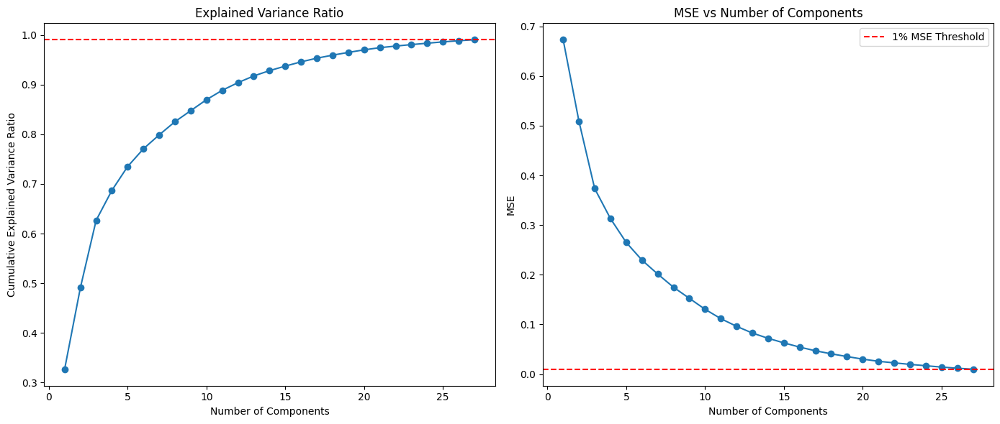

In [258]:
# Standardize the features
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Initialize lists to store MSE and explained variance ratio
mse_errors = []
explained_variance_ratios = []

# Test PCA with varying numbers of components
pca = PCA()
pca.fit(df_scaled)
explained_variance_ratio = pca.explained_variance_ratio_

for n_components in range(1, df_scaled.shape[1] + 1):
    pca = PCA(n_components=n_components)
    df_pca_reduced = pca.fit_transform(df_scaled)
    df_pca_reconstructed = pca.inverse_transform(df_pca_reduced)
    mse = mean_squared_error(df_scaled, df_pca_reconstructed)
    mse_errors.append(mse)

    # Calculate the cumulative explained variance ratio
    cumulative_variance_ratio = np.sum(explained_variance_ratio[:n_components])
    explained_variance_ratios.append(cumulative_variance_ratio)

    if mse <= 0.01:  # 1% MSE error threshold
        print(f"Number of components needed to achieve <= 1% MSE: {n_components}")
        # Plot cumulative explained variance ratio and MSE errors
        plt.figure(figsize=(14, 6))

        # Plot cumulative explained variance ratio
        plt.subplot(1, 2, 1)
        plt.plot(range(1, len(mse_errors) + 1), explained_variance_ratios, marker='o')
        plt.xlabel('Number of Components')
        plt.ylabel('Cumulative Explained Variance Ratio')
        plt.axhline(y=0.99, color='r', linestyle='--', label='99% Variance Threshold')
        plt.title('Explained Variance Ratio')

        # Plot MSE errors
        plt.subplot(1, 2, 2)
        plt.plot(range(1, len(mse_errors) + 1), mse_errors, marker='o')
        plt.axhline(y=0.01, color='r', linestyle='--', label='1% MSE Threshold')
        plt.xlabel('Number of Components')
        plt.ylabel('MSE')
        plt.title('MSE vs Number of Components')
        plt.legend()

        plt.tight_layout()
        plt.show()
        break

## Q2

In [259]:
# Size of the input dim and bottleneck dimension
input_dim = df_scaled.shape[1]
bottleneck_dim = 3

# Splitting data into training and test sets
X_train, X_test = train_test_split(df_scaled, test_size=0.2, random_state=42)

# Input layer
input_layer = Input(shape=(input_dim,))

# Encoder
encoded = Dense(64, activation='tanh')(input_layer)
encoded = Dense(32, activation='tanh')(encoded)
encoded = Dense(bottleneck_dim, activation='tanh')(encoded)  # Bottleneck layer

# Decoder
decoded = Dense(32, activation='tanh')(encoded)
decoded = Dense(64, activation='tanh')(decoded)
decoded = Dense(input_dim, activation='sigmoid')(decoded)  # Output layer with sigmoid activation

# Build the autoencoder model
autoencoder = Model(inputs=input_layer, outputs=decoded)

# Compile the model
autoencoder.compile(optimizer='adam', loss='mean_squared_error')

# Summary of the model
autoencoder.summary()

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss',
                               patience=50,  # Number of epochs to wait for improvement
                               restore_best_weights=True)
# Fit the autoencoder model
history = autoencoder.fit(X_train, X_train,
                          epochs=1000,
                          batch_size=256,
                          shuffle=True,
                          validation_data=(X_test, X_test),
                          callbacks=[early_stopping])

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 41)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 64)                  │           2,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 3)                   │              99 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 32)                  │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 41)                  │           2,665 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,772 (38.17 KB)

 Trainable params: 9,772 (38.17 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 272ms/step - loss: 1.2363 - val_loss: 1.2189
Epoch 2/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.2356 - val_loss: 1.1932
Epoch 3/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2079 - val_loss: 1.1663
Epoch 4/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.2044 - val_loss: 1.1394
Epoch 5/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.1347 - val_loss: 1.1123
Epoch 6/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0998 - val_loss: 1.0854
Epoch 7/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0854 - val_loss: 1.0592
Epoch 8/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0462 - val_loss: 1.0344
Epoch 9/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0286 - val_loss: 1.0112
Epoch 10/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0126 - val_loss: 0.9897
Epoch 11/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.9945 - val_loss: 0.9693
Epoch 12/1000
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.9565 - v

### a).

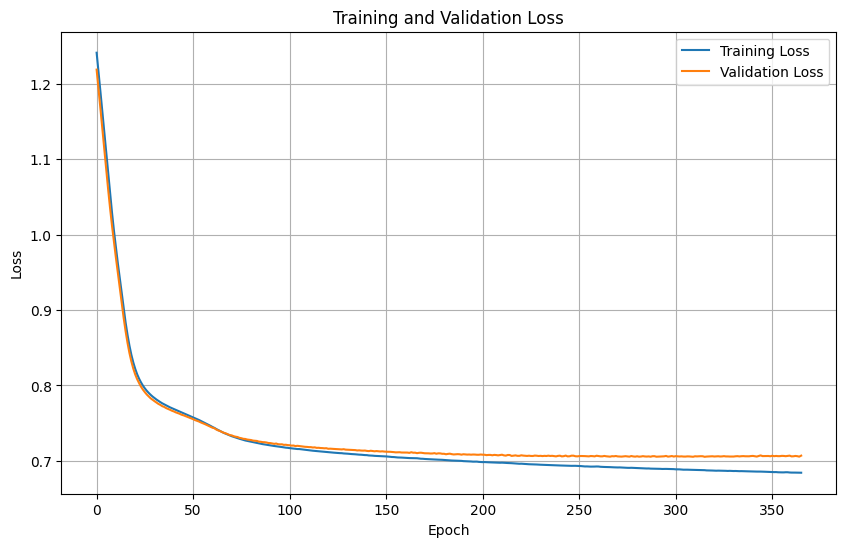

In [260]:
# Plotting training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

### b).

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


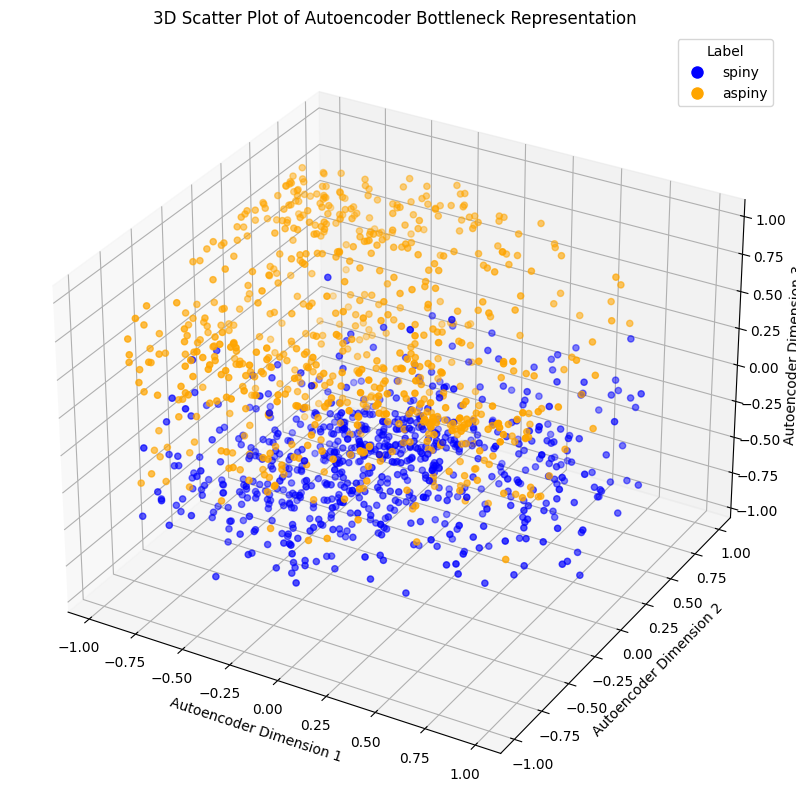

In [261]:
# Using the encoder to transform the data into the 3D bottleneck space
encoder = Model(inputs=autoencoder.input, outputs=autoencoder.layers[3].output)
encoded_data = encoder.predict(df_scaled)

# Plot the 3D scatter plot using the encoded data (bottleneck representation)
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(encoded_data[:, 0], encoded_data[:, 1], encoded_data[:, 2], c=colors)
ax.set_xlabel('Autoencoder Dimension 1')
ax.set_ylabel('Autoencoder Dimension 2')
ax.set_zlabel('Autoencoder Dimension 3')
plt.title('3D Scatter Plot of Autoencoder Bottleneck Representation')
legend_labels = list(color_map.keys())
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_map[label], markersize=10, label=label) for label in legend_labels]
ax.legend(handles=handles, title='Label')
plt.show()

In [262]:
# Getting the reconstructed test data from the autoencoder
reconstructed_data = autoencoder.predict(X_test)
# Calculating reconstruction error (MSE) for the autoencoder
autoencoder_mse = np.mean(np.square(X_test - reconstructed_data))
print(f"Autoencoder Reconstruction Error (MSE): {autoencoder_mse}")


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Autoencoder Reconstruction Error (MSE): 0.705422472966584


In [263]:
# Reducing the dimensionality to 3 using PCA
pca = PCA(n_components=3)
X_test_pca = pca.fit_transform(X_test)

# Reconstructing the original data from the PCA representation
X_test_pca_reconstructed = pca.inverse_transform(X_test_pca)

# Calculating reconstruction error (MSE) for PCA
pca_mse = np.mean(np.square(X_test - X_test_pca_reconstructed))
print(f"PCA Reconstruction Error (MSE): {pca_mse}")

PCA Reconstruction Error (MSE): 0.37272752762932115


In [264]:
# Same here for the entire dataset

# PCA
reconstructed_data_full = autoencoder.predict(df_scaled)
autoencoder_mse_full = np.mean(np.square(df_scaled - reconstructed_data_full))
print(f"Autoencoder Reconstruction Error (MSE) on Full Dataset: {autoencoder_mse_full}")

# PCA
pca_full = PCA(n_components=3)
df_scaled_pca = pca_full.fit_transform(df_scaled)
df_scaled_pca_reconstructed = pca_full.inverse_transform(df_scaled_pca)
pca_mse_full = np.mean(np.square(df_scaled - df_scaled_pca_reconstructed))
print(f"PCA Reconstruction Error (MSE) on Full Dataset: {pca_mse_full}")

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Autoencoder Reconstruction Error (MSE) on Full Dataset: 0.690987616862448
PCA Reconstruction Error (MSE) on Full Dataset: 0.3733233644578676


In [265]:
#Results

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


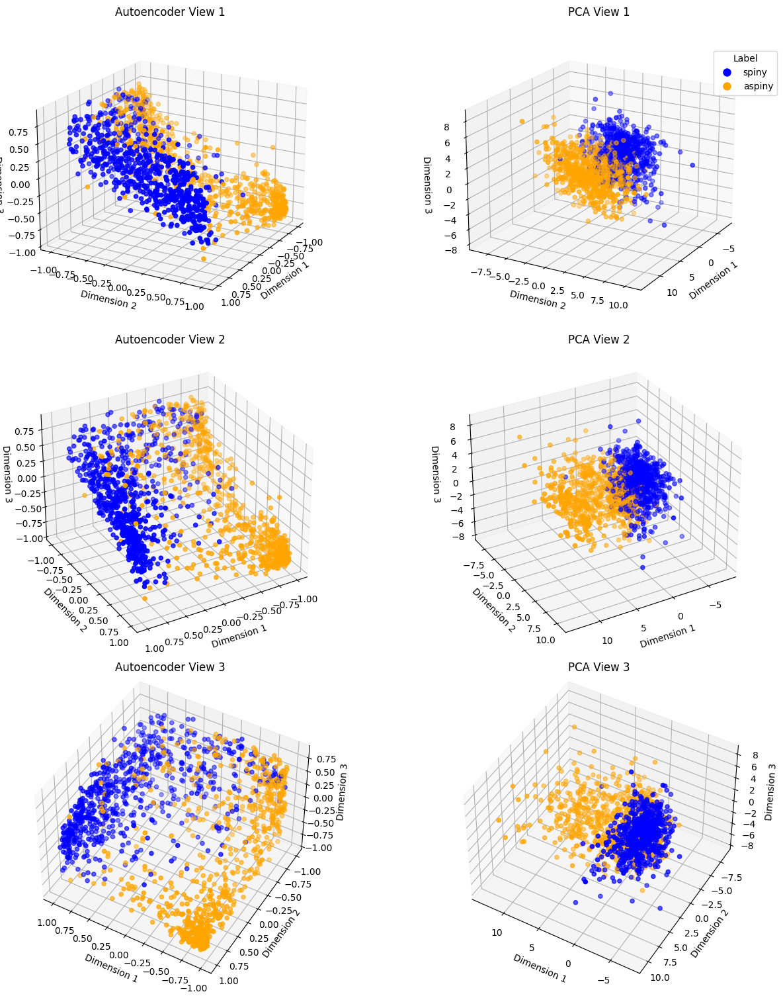

In [266]:

encoder = Model(inputs=autoencoder.input, outputs=autoencoder.get_layer(index=2).output)
encoded_data_full = encoder.predict(df_scaled)
pca_full = PCA(n_components=3)
df_scaled_pca = pca_full.fit_transform(df_scaled)

# 3D scatter plot function for both Autoencoder and PCA
def scatter_plot_3d(ax, data, title, colors):
    sc = ax.scatter(data[:, 0], data[:, 1], data[:, 2], c=colors)
    ax.set_xlabel('Dimension 1')
    ax.set_ylabel('Dimension 2')
    ax.set_zlabel('Dimension 3')
    ax.set_title(title)

# Angles for different views
view_angles = [(20, 30), (30, 60), (45, 120)]  # (elevation, azimuth)
fig = plt.figure(figsize=(15, 15))

# Showing different angles of each plot
for i, (elev, azim) in enumerate(view_angles):
    # Autoencoder plot
    ax_autoencoder = fig.add_subplot(3, 2, 2*i+1, projection='3d')
    scatter_plot_3d(ax_autoencoder, encoded_data_full, f'Autoencoder View {i+1}', colors)
    ax_autoencoder.view_init(elev=elev, azim=azim)

    # PCA plot
    ax_pca = fig.add_subplot(3, 2, 2*i+2, projection='3d')
    scatter_plot_3d(ax_pca, df_scaled_pca, f'PCA View {i+1}', colors)
    ax_pca.view_init(elev=elev, azim=azim)

# Legend
legend_labels = list(color_map.keys())
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_map[label], markersize=10, label=label) for label in legend_labels]
fig.legend(handles=handles, title='Label', loc='upper right', bbox_to_anchor=(0.9, 0.95))

plt.tight_layout()
plt.show()


#Part 3

In [267]:
# Loading the data
df_load = pd.read_csv("/content/drive/MyDrive/David_and_Yoni/Neural Networks/Final Project/feat_data.csv")

In [268]:
labels = df_load.iloc[:, 0]
features = df_load.iloc[:, 1:]

# Split the data into training and test sets with stratification
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, stratify=labels, random_state=42)

print(f"Training features shape: {X_train.shape}")
print(f"Test features shape: {X_test.shape}")
print(f"Training labels shape: {y_train.shape}")
print(f"Test labels shape: {y_test.shape}")

Training features shape: (1139, 41)
Test features shape: (285, 41)
Training labels shape: (1139,)
Test labels shape: (285,)


## Logistic Regression

In [269]:
lr = LogisticRegression(max_iter=1000, random_state=42)
lr.fit(X_train, y_train)

# Predicting on the test set
y_pred = lr.predict(X_test)
y_prob = lr.predict_proba(X_test)[:, 1]  # Probability estimates for the positive class

# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, pos_label='spiny')  # Adjust pos_label as needed
recall = recall_score(y_test, y_pred, pos_label='spiny')  # Adjust pos_label as needed
roc_auc = roc_auc_score(y_test, y_prob)
class_report = classification_report(y_test, y_pred)

# Printing metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"ROC AUC: {roc_auc:.4f}")
print("Classification Report:")
print(class_report)

Accuracy: 0.9754
Precision: 0.9854
Recall: 0.9643
ROC AUC: 0.9971
Classification Report:
              precision    recall  f1-score   support

      aspiny       0.97      0.99      0.98       145
       spiny       0.99      0.96      0.97       140

    accuracy                           0.98       285
   macro avg       0.98      0.98      0.98       285
weighted avg       0.98      0.98      0.98       285



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


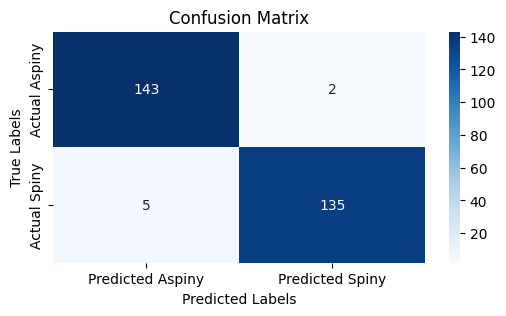

In [270]:
# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=['aspiny', 'spiny'])

# Plotting the confusion matrix
plt.figure(figsize=(6, 3))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Predicted Aspiny', 'Predicted Spiny'],
            yticklabels=['Actual Aspiny', 'Actual Spiny'])

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

##Perceptron

In [271]:
# Convert labels to numeric values
lb = LabelBinarizer()
y_train_numeric = lb.fit_transform(y_train).ravel()
y_test_numeric = lb.transform(y_test).ravel()

# Now you can fit and predict
perceptron = Perceptron(random_state=42)
perceptron.fit(X_train, y_train_numeric)

# Predict on the test set
y_pred_perceptron_numeric = perceptron.predict(X_test)

# Calculate performance metrics
accuracy_perceptron = accuracy_score(y_test_numeric, y_pred_perceptron_numeric)
precision_perceptron = precision_score(y_test_numeric, y_pred_perceptron_numeric)
recall_perceptron = recall_score(y_test_numeric, y_pred_perceptron_numeric)
roc_auc_perceptron = roc_auc_score(y_test_numeric, y_pred_perceptron_numeric)

# Printing perceptron metrics
print(f"Perceptron Accuracy: {accuracy_perceptron:.4f}")
print(f"Perceptron Precision: {precision_perceptron:.4f}")
print(f"Perceptron Recall: {recall_perceptron:.4f}")
print(f"Perceptron ROC AUC: {roc_auc_perceptron:.4f}")

# Classification report for perceptron
class_report_perceptron = classification_report(y_test_numeric, y_pred_perceptron_numeric)
print("Perceptron Classification Report:")
print(class_report_perceptron)

# Compare the predictions from both models for McNemar's test
comparison_matrix = confusion_matrix(y_test_numeric, y_pred_perceptron_numeric)

print("\nConfusion matrix for comparison (logistic regression vs perceptron):")
print(comparison_matrix)

# Applying McNemar's test
result = mcnemar(comparison_matrix, exact=True)
print(f"\nMcNemar's test p-value: {result.pvalue:.4f}")

Perceptron Accuracy: 0.8807
Perceptron Precision: 0.8487
Perceptron Recall: 0.9214
Perceptron ROC AUC: 0.8814
Perceptron Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.84      0.88       145
           1       0.85      0.92      0.88       140

    accuracy                           0.88       285
   macro avg       0.88      0.88      0.88       285
weighted avg       0.88      0.88      0.88       285


Confusion matrix for comparison (logistic regression vs perceptron):
[[122  23]
 [ 11 129]]

McNemar's test p-value: 0.0576


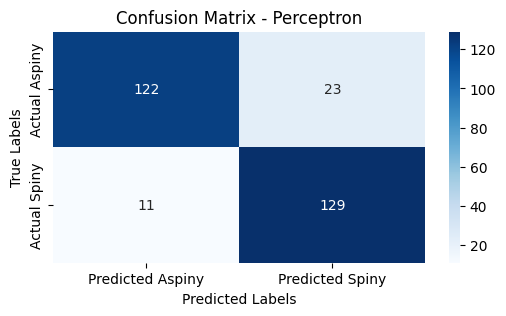

In [272]:

# Plotting the confusion matrix
cm_perceptron = confusion_matrix(y_test_numeric, y_pred_perceptron_numeric)

plt.figure(figsize=(6, 3))
sns.heatmap(cm_perceptron, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Predicted Aspiny', 'Predicted Spiny'],
            yticklabels=['Actual Aspiny', 'Actual Spiny'])

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix - Perceptron')
plt.show()


### Overfitting check

In [273]:
# Calculating the statistics with the training set
accuracy_train = accuracy_score(y_train_numeric, perceptron.predict(X_train))
precision_train = precision_score(y_train_numeric, perceptron.predict(X_train))
recall_train = recall_score(y_train_numeric, perceptron.predict(X_train))
roc_auc_train = roc_auc_score(y_train_numeric, perceptron.predict(X_train))

# Printing training set metrics
print(f"Training Set Accuracy: {accuracy_train:.4f}")
print(f"Training Set Precision: {precision_train:.4f}")
print(f"Training Set Recall: {recall_train:.4f}")
print(f"Training Set ROC AUC: {roc_auc_train:.4f}")

# Classification report for training set
class_report_train = classification_report(y_train_numeric, perceptron.predict(X_train))
print("\nTraining Set Classification Report:")
print(class_report_train)

#Overfitting testing
acc_diff = accuracy_train - accuracy_perceptron
prec_diff = precision_train - precision_perceptron
rec_diff = recall_train - recall_perceptron
roc_auc_diff = roc_auc_train - roc_auc_perceptron

print(f"\nDifference in Accuracy: {acc_diff:.4f}")
print(f"Difference in Precision: {prec_diff:.4f}")
print(f"Difference in Recall: {rec_diff:.4f}")
print(f"Difference in ROC AUC: {roc_auc_diff:.4f}")

Training Set Accuracy: 0.8982
Training Set Precision: 0.8688
Training Set Recall: 0.9339
Training Set ROC AUC: 0.8987

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.86      0.90       579
           1       0.87      0.93      0.90       560

    accuracy                           0.90      1139
   macro avg       0.90      0.90      0.90      1139
weighted avg       0.90      0.90      0.90      1139


Difference in Accuracy: 0.0175
Difference in Precision: 0.0201
Difference in Recall: 0.0125
Difference in ROC AUC: 0.0173


##MLP

In [274]:
# Setting the seed for reproducibility
SEED = 1234
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
import torch.utils.data as data
import torchvision.datasets as dataset

In [275]:
# Loading the data
df_load = pd.read_csv("/content/drive/MyDrive/David_and_Yoni/Neural Networks/Final Project/feat_data.csv")

print(df_load.shape)
df_load.head()

(1424, 42)


,dendrite_type,threshold_v,threshold_i,peak_v,peak_i,trough_v,trough_i,upstroke,upstroke_v,downstroke,...,threshold_v_ramp,threshold_v_short_square,trough_v_long_square,trough_v_ramp,trough_v_short_square,upstroke_downstroke_ratio_long_square,upstroke_downstroke_ratio_ramp,upstroke_downstroke_ratio_short_square,vm_for_sag,vrest
0,aspiny,-33.490959,536.025940,28.835495,537.739807,-55.978970,531.014160,299.764818,-0.535574,-217.133925,...,-33.812500,-43.500002,-59.281254,-57.468754,-75.756252,1.564027,1.304349,1.679550,-87.906258,-74.926987
1,aspiny,-38.694119,463.681763,17.997391,464.439911,-56.637856,462.351837,360.113308,-6.811609,-274.223488,...,-29.187501,-44.046875,-55.875000,-52.515627,-69.109379,1.162618,1.197155,1.369171,-80.156250,-72.042976
2,aspiny,-32.416935,457.616455,22.210737,456.798065,-47.572384,355.919861,210.460299,-2.773237,-52.187941,...,-32.312503,-38.197918,-48.187500,-54.364586,-72.640628,3.379321,4.108774,2.680139,-83.593758,-72.712036
3,aspiny,-30.264706,195.426468,11.924632,195.602936,-48.987133,161.492645,196.672333,-10.977942,-96.910837,...,-36.062601,-41.265626,-48.593754,-54.581137,-63.257814,2.132316,2.867415,2.185564,-87.656250,-62.055580
4,spiny,-37.541275,121.457550,41.824291,121.318398,-53.327831,98.995285,334.820846,3.641510,-91.202334,...,-38.697918,-45.306252,-57.281254,-56.406253,-70.537502,4.059995,4.121745,4.017244,-87.093758,-69.362984


In [276]:
# Loading Data
X = df_load.iloc[:, 1:].values
y = df_load.iloc[:, 0].values

# Standardizing the Data
#scaler = StandardScaler()
#X = scaler.fit_transform(X)

# Encoding labels (spiny=1, aspiny=0)
y = np.where(y == 'spiny', 1, 0)

# Splitting into train, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=SEED)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=SEED)

# Converting to PyTorch datasets
class TabularDataset(data.Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

train_data = TabularDataset(X_train, y_train)
valid_data = TabularDataset(X_valid, y_valid)
test_data = TabularDataset(X_test, y_test)

### Stochastic Gradient Descent

In [277]:
# Creating data loaders
BATCH_SIZE = 10
train_iterator = data.DataLoader(train_data, shuffle=True, batch_size=BATCH_SIZE)
valid_iterator = data.DataLoader(valid_data, batch_size=BATCH_SIZE)
test_iterator = data.DataLoader(test_data, batch_size=BATCH_SIZE)

In [278]:
# MLP model for binary classification
class MLP(nn.Module):
    def __init__(self, input_dim, output_dim):
        super().__init__()
        self.input_fc = nn.Linear(input_dim, 100)  # Adjust hidden units if needed
        self.hidden_fc = nn.Linear(100, 50)
        self.output_fc = nn.Linear(50, output_dim)

    def forward(self, x):
        h_1 = F.relu(self.input_fc(x))
        h_2 = F.relu(self.hidden_fc(h_1))
        y_pred = self.output_fc(h_2)
        return y_pred

In [279]:
# Initializing the model, loss function, and optimizer
INPUT_DIM = X_train.shape[1]
OUTPUT_DIM = 2  # Binary classification (aspiny or spiny)
model = MLP(INPUT_DIM, OUTPUT_DIM)

optimizer = optim.SGD(model.parameters())
criterion = nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = model.to(device)
criterion = criterion.to(device)

In [280]:
# Functions to calculate accuracy and to train/evaluate the model
def calculate_accuracy(y_pred, y):
    top_pred = y_pred.argmax(1, keepdim=True)
    correct = top_pred.eq(y.view_as(top_pred)).sum()
    acc = correct.float() / y.shape[0]
    return acc

def train(model, iterator, optimizer, criterion, device):
    epoch_loss = 0
    epoch_acc = 0
    model.train()

    for (x, y) in tqdm(iterator, desc="Training", leave=False):
        x = x.to(device)
        y = y.to(device)
        optimizer.zero_grad()
        y_pred = model(x)
        loss = criterion(y_pred, y)
        acc = calculate_accuracy(y_pred, y)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion, device):
    epoch_loss = 0
    epoch_acc = 0
    model.eval()

    with torch.no_grad():
        for (x, y) in tqdm(iterator, desc="Evaluating", leave=False):
            x = x.to(device)
            y = y.to(device)
            y_pred = model(x)
            loss = criterion(y_pred, y)
            acc = calculate_accuracy(y_pred, y)
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

In [281]:
# Training the model
EPOCHS = 100
best_valid_loss = float('inf')
train_losses = []
valid_losses = []
for epoch in trange(EPOCHS):
    train_loss, train_acc = train(model, train_iterator, optimizer, criterion, device)
    valid_loss, valid_acc = evaluate(model, valid_iterator, criterion, device)
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'mlp-model.pt')

    print(f'Epoch: {epoch+1} | Train Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}% | Val Loss: {valid_loss:.3f} | Val Acc: {valid_acc*100:.2f}%')



  0%|          | 0/100 [00:00<?, ?it/s]

Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 | Train Loss: 0.911 | Train Acc: 80.16% | Val Loss: 0.387 | Val Acc: 80.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 2 | Train Loss: 0.328 | Train Acc: 87.01% | Val Loss: 0.276 | Val Acc: 87.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 3 | Train Loss: 0.286 | Train Acc: 87.61% | Val Loss: 0.245 | Val Acc: 90.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 4 | Train Loss: 0.263 | Train Acc: 88.76% | Val Loss: 0.200 | Val Acc: 91.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 5 | Train Loss: 0.245 | Train Acc: 90.79% | Val Loss: 0.155 | Val Acc: 97.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 6 | Train Loss: 0.242 | Train Acc: 90.00% | Val Loss: 0.139 | Val Acc: 97.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 7 | Train Loss: 0.227 | Train Acc: 90.44% | Val Loss: 0.191 | Val Acc: 92.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 8 | Train Loss: 0.202 | Train Acc: 92.00% | Val Loss: 0.361 | Val Acc: 86.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 9 | Train Loss: 0.221 | Train Acc: 91.04% | Val Loss: 0.153 | Val Acc: 94.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 10 | Train Loss: 0.208 | Train Acc: 92.37% | Val Loss: 0.180 | Val Acc: 92.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 11 | Train Loss: 0.189 | Train Acc: 92.97% | Val Loss: 0.134 | Val Acc: 96.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 12 | Train Loss: 0.182 | Train Acc: 92.46% | Val Loss: 0.126 | Val Acc: 97.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 13 | Train Loss: 0.190 | Train Acc: 92.70% | Val Loss: 0.109 | Val Acc: 97.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 14 | Train Loss: 0.180 | Train Acc: 93.25% | Val Loss: 0.113 | Val Acc: 97.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 15 | Train Loss: 0.177 | Train Acc: 93.07% | Val Loss: 0.120 | Val Acc: 97.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 16 | Train Loss: 0.176 | Train Acc: 93.68% | Val Loss: 0.111 | Val Acc: 98.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 17 | Train Loss: 0.159 | Train Acc: 94.21% | Val Loss: 0.271 | Val Acc: 89.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 18 | Train Loss: 0.183 | Train Acc: 92.63% | Val Loss: 0.159 | Val Acc: 93.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 19 | Train Loss: 0.165 | Train Acc: 93.33% | Val Loss: 0.100 | Val Acc: 98.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 20 | Train Loss: 0.157 | Train Acc: 93.95% | Val Loss: 0.117 | Val Acc: 96.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 21 | Train Loss: 0.170 | Train Acc: 93.76% | Val Loss: 0.229 | Val Acc: 89.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 22 | Train Loss: 0.164 | Train Acc: 93.68% | Val Loss: 0.119 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 23 | Train Loss: 0.160 | Train Acc: 93.68% | Val Loss: 0.108 | Val Acc: 98.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 24 | Train Loss: 0.161 | Train Acc: 94.21% | Val Loss: 0.138 | Val Acc: 94.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 25 | Train Loss: 0.163 | Train Acc: 93.95% | Val Loss: 0.124 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 26 | Train Loss: 0.155 | Train Acc: 94.21% | Val Loss: 0.227 | Val Acc: 89.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 27 | Train Loss: 0.157 | Train Acc: 94.09% | Val Loss: 0.119 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 28 | Train Loss: 0.140 | Train Acc: 95.00% | Val Loss: 0.111 | Val Acc: 95.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 29 | Train Loss: 0.128 | Train Acc: 95.79% | Val Loss: 0.122 | Val Acc: 94.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 30 | Train Loss: 0.137 | Train Acc: 95.00% | Val Loss: 0.117 | Val Acc: 95.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 31 | Train Loss: 0.147 | Train Acc: 93.59% | Val Loss: 0.163 | Val Acc: 93.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 32 | Train Loss: 0.139 | Train Acc: 94.55% | Val Loss: 0.123 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 33 | Train Loss: 0.139 | Train Acc: 94.39% | Val Loss: 0.111 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 34 | Train Loss: 0.129 | Train Acc: 94.82% | Val Loss: 0.178 | Val Acc: 93.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 35 | Train Loss: 0.135 | Train Acc: 94.47% | Val Loss: 0.092 | Val Acc: 97.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 36 | Train Loss: 0.132 | Train Acc: 94.65% | Val Loss: 0.103 | Val Acc: 96.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 37 | Train Loss: 0.128 | Train Acc: 95.08% | Val Loss: 0.096 | Val Acc: 96.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 38 | Train Loss: 0.135 | Train Acc: 94.73% | Val Loss: 0.096 | Val Acc: 98.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 39 | Train Loss: 0.124 | Train Acc: 95.00% | Val Loss: 0.093 | Val Acc: 98.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 40 | Train Loss: 0.127 | Train Acc: 95.52% | Val Loss: 0.125 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 41 | Train Loss: 0.123 | Train Acc: 95.09% | Val Loss: 0.115 | Val Acc: 95.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 42 | Train Loss: 0.119 | Train Acc: 96.05% | Val Loss: 0.084 | Val Acc: 98.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 43 | Train Loss: 0.121 | Train Acc: 95.26% | Val Loss: 0.109 | Val Acc: 98.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 44 | Train Loss: 0.115 | Train Acc: 95.42% | Val Loss: 0.247 | Val Acc: 89.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 45 | Train Loss: 0.121 | Train Acc: 95.53% | Val Loss: 0.196 | Val Acc: 91.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 46 | Train Loss: 0.120 | Train Acc: 95.26% | Val Loss: 0.095 | Val Acc: 97.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 47 | Train Loss: 0.127 | Train Acc: 94.74% | Val Loss: 0.112 | Val Acc: 97.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 48 | Train Loss: 0.115 | Train Acc: 95.88% | Val Loss: 0.114 | Val Acc: 95.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 49 | Train Loss: 0.109 | Train Acc: 95.34% | Val Loss: 0.106 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 50 | Train Loss: 0.111 | Train Acc: 96.32% | Val Loss: 0.099 | Val Acc: 96.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 51 | Train Loss: 0.106 | Train Acc: 95.88% | Val Loss: 0.112 | Val Acc: 94.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 52 | Train Loss: 0.119 | Train Acc: 94.62% | Val Loss: 0.121 | Val Acc: 95.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 53 | Train Loss: 0.099 | Train Acc: 96.58% | Val Loss: 0.087 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 54 | Train Loss: 0.111 | Train Acc: 96.22% | Val Loss: 0.101 | Val Acc: 96.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 55 | Train Loss: 0.095 | Train Acc: 96.75% | Val Loss: 0.101 | Val Acc: 95.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 56 | Train Loss: 0.107 | Train Acc: 95.60% | Val Loss: 0.142 | Val Acc: 94.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 57 | Train Loss: 0.103 | Train Acc: 95.96% | Val Loss: 0.092 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 58 | Train Loss: 0.097 | Train Acc: 96.57% | Val Loss: 0.108 | Val Acc: 98.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 59 | Train Loss: 0.111 | Train Acc: 95.61% | Val Loss: 0.244 | Val Acc: 89.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 60 | Train Loss: 0.140 | Train Acc: 94.82% | Val Loss: 0.094 | Val Acc: 98.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 61 | Train Loss: 0.109 | Train Acc: 95.69% | Val Loss: 0.300 | Val Acc: 90.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 62 | Train Loss: 0.125 | Train Acc: 95.26% | Val Loss: 0.089 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 63 | Train Loss: 0.095 | Train Acc: 95.87% | Val Loss: 0.151 | Val Acc: 94.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 64 | Train Loss: 0.099 | Train Acc: 95.88% | Val Loss: 0.118 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 65 | Train Loss: 0.094 | Train Acc: 96.93% | Val Loss: 0.107 | Val Acc: 96.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 66 | Train Loss: 0.087 | Train Acc: 96.67% | Val Loss: 0.131 | Val Acc: 94.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 67 | Train Loss: 0.090 | Train Acc: 97.18% | Val Loss: 0.232 | Val Acc: 89.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 68 | Train Loss: 0.097 | Train Acc: 96.23% | Val Loss: 0.126 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 69 | Train Loss: 0.103 | Train Acc: 96.67% | Val Loss: 0.111 | Val Acc: 94.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 70 | Train Loss: 0.087 | Train Acc: 97.27% | Val Loss: 0.137 | Val Acc: 94.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 71 | Train Loss: 0.086 | Train Acc: 96.49% | Val Loss: 0.122 | Val Acc: 97.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 72 | Train Loss: 0.104 | Train Acc: 95.61% | Val Loss: 0.105 | Val Acc: 97.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 73 | Train Loss: 0.113 | Train Acc: 95.26% | Val Loss: 0.093 | Val Acc: 96.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 74 | Train Loss: 0.092 | Train Acc: 96.13% | Val Loss: 0.143 | Val Acc: 94.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 75 | Train Loss: 0.090 | Train Acc: 97.02% | Val Loss: 0.205 | Val Acc: 92.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 76 | Train Loss: 0.090 | Train Acc: 96.30% | Val Loss: 0.118 | Val Acc: 93.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 77 | Train Loss: 0.084 | Train Acc: 97.10% | Val Loss: 0.113 | Val Acc: 94.00%


Training:   0%|          | 0/114 [00:01<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 78 | Train Loss: 0.084 | Train Acc: 96.84% | Val Loss: 0.098 | Val Acc: 96.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 79 | Train Loss: 0.098 | Train Acc: 96.04% | Val Loss: 0.113 | Val Acc: 94.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 80 | Train Loss: 0.096 | Train Acc: 96.49% | Val Loss: 0.138 | Val Acc: 93.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 81 | Train Loss: 0.085 | Train Acc: 97.54% | Val Loss: 0.207 | Val Acc: 92.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 82 | Train Loss: 0.092 | Train Acc: 96.05% | Val Loss: 0.125 | Val Acc: 96.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 83 | Train Loss: 0.084 | Train Acc: 96.93% | Val Loss: 0.110 | Val Acc: 93.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 84 | Train Loss: 0.079 | Train Acc: 97.18% | Val Loss: 0.120 | Val Acc: 93.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 85 | Train Loss: 0.091 | Train Acc: 95.96% | Val Loss: 0.074 | Val Acc: 98.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 86 | Train Loss: 0.077 | Train Acc: 97.28% | Val Loss: 0.130 | Val Acc: 94.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 87 | Train Loss: 0.076 | Train Acc: 97.19% | Val Loss: 0.161 | Val Acc: 94.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 88 | Train Loss: 0.088 | Train Acc: 97.02% | Val Loss: 0.121 | Val Acc: 95.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 89 | Train Loss: 0.083 | Train Acc: 97.18% | Val Loss: 0.126 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 90 | Train Loss: 0.080 | Train Acc: 97.71% | Val Loss: 0.141 | Val Acc: 94.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 91 | Train Loss: 0.075 | Train Acc: 97.11% | Val Loss: 0.145 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 92 | Train Loss: 0.079 | Train Acc: 96.93% | Val Loss: 0.106 | Val Acc: 96.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 93 | Train Loss: 0.069 | Train Acc: 97.62% | Val Loss: 0.109 | Val Acc: 96.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 94 | Train Loss: 0.074 | Train Acc: 96.93% | Val Loss: 0.148 | Val Acc: 94.67%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 95 | Train Loss: 0.070 | Train Acc: 97.37% | Val Loss: 0.091 | Val Acc: 97.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 96 | Train Loss: 0.066 | Train Acc: 97.54% | Val Loss: 0.100 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 97 | Train Loss: 0.067 | Train Acc: 97.28% | Val Loss: 0.110 | Val Acc: 95.33%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 98 | Train Loss: 0.095 | Train Acc: 96.14% | Val Loss: 0.147 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 99 | Train Loss: 0.067 | Train Acc: 97.28% | Val Loss: 0.098 | Val Acc: 96.00%


Training:   0%|          | 0/114 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 100 | Train Loss: 0.069 | Train Acc: 97.28% | Val Loss: 0.126 | Val Acc: 96.00%


In [282]:
# Loading the best model to test it
model.load_state_dict(torch.load('mlp-model.pt'))
test_loss, test_acc = evaluate(model, test_iterator, criterion, device)
print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

<ipython-input-282-93ae9c0fdb8b>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('mlp-model.pt'))


Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Test Loss: 0.136 | Test Acc: 96.00%


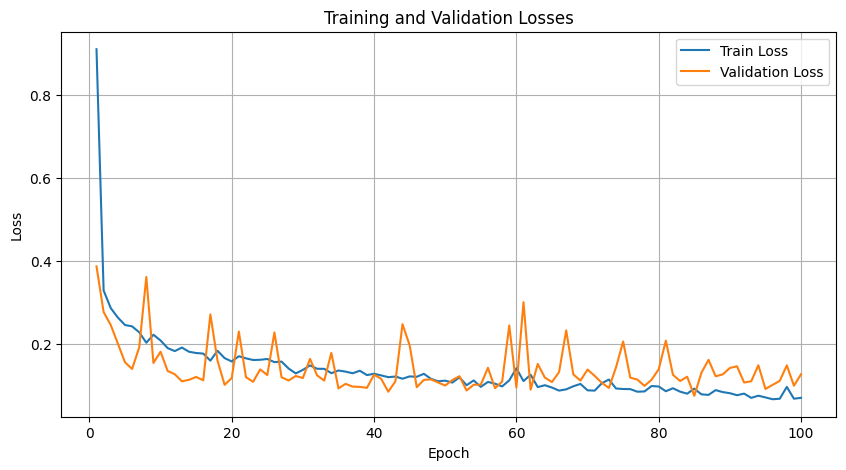

In [283]:
# Plot training and validation losses
plt.figure(figsize=(10, 5))
plt.plot(range(1, EPOCHS + 1), train_losses, label='Train Loss')
plt.plot(range(1, EPOCHS + 1), valid_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.grid(True)
plt.show()

In [284]:
# Loading the best model
model.load_state_dict(torch.load('mlp-model.pt'))
model.eval()

<ipython-input-284-a3aff4510c21>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('mlp-model.pt'))


MLP(
  (input_fc): Linear(in_features=41, out_features=100, bias=True)
  (hidden_fc): Linear(in_features=100, out_features=50, bias=True)
  (output_fc): Linear(in_features=50, out_features=2, bias=True)
)

In [285]:
# Function to get predictions
def get_predictions(iterator, model, device):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for (x, y) in iterator:
            x = x.to(device)
            y = y.to(device)
            y_pred = model(x)
            preds = y_pred.argmax(1).cpu().numpy()
            labels = y.cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels)

    return np.array(all_preds), np.array(all_labels)

Classification Report:
               precision    recall  f1-score   support

      aspiny       0.96      0.96      0.96        76
       spiny       0.96      0.96      0.96        67

    accuracy                           0.96       143
   macro avg       0.96      0.96      0.96       143
weighted avg       0.96      0.96      0.96       143



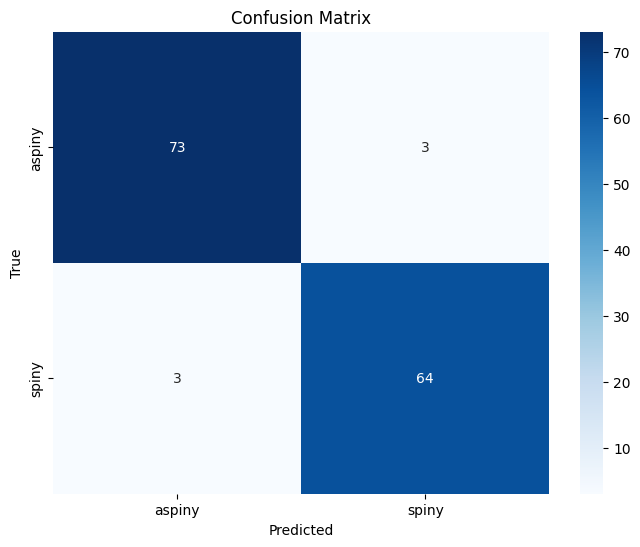

In [286]:

# Get predictions and true labels from the test set
y_pred_labels, y_true_labels = get_predictions(test_iterator, model, device)

# Classification report
print("Classification Report:\n", classification_report(y_true_labels, y_pred_labels, target_names=['aspiny', 'spiny']))

# Confusion matrix
conf_matrix = confusion_matrix(y_true_labels, y_pred_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['aspiny', 'spiny'], yticklabels=['aspiny', 'spiny'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

Classification Report (Entire Dataset):
               precision    recall  f1-score   support

      aspiny       0.97      0.98      0.98       724
       spiny       0.98      0.97      0.97       700

    accuracy                           0.98      1424
   macro avg       0.98      0.98      0.98      1424
weighted avg       0.98      0.98      0.98      1424



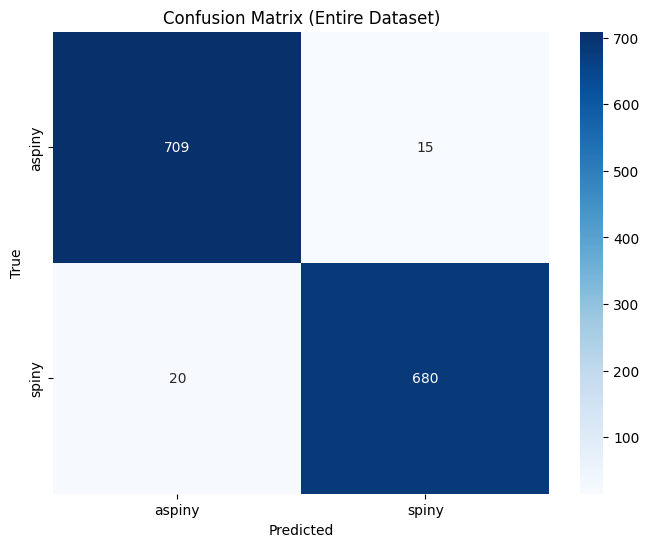

In [287]:
X_all = np.concatenate((X_train, X_valid, X_test), axis=0)
y_all = np.concatenate((y_train, y_valid, y_test), axis=0)
dataset = TabularDataset(X_all, y_all)
iterator = data.DataLoader(dataset, batch_size=BATCH_SIZE)

# Get predictions and true labels from the entire dataset
y_pred_labels_all, y_true_labels_all = get_predictions(iterator, model, device)

# Compute and print classification report
print("Classification Report (Entire Dataset):\n", classification_report(y_true_labels_all, y_pred_labels_all, target_names=['aspiny', 'spiny']))

# Confusion matrix
conf_matrix_all = confusion_matrix(y_true_labels_all, y_pred_labels_all)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_all, annot=True, fmt='d', cmap='Blues',
            xticklabels=['aspiny', 'spiny'], yticklabels=['aspiny', 'spiny'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Entire Dataset)')
plt.show()

Gradient Descent:
In this case we will show our model all of our training examples so will not use BATCH_SIZE when training the model this time. SGD in Pytorch optimizers has a default of momentum=0. Therefore the only difference is that GD will see all of the examples and update based off of that. We will keep Pytorch's default lr=0.01 in order to compare with the SGD implementation of BATCH_SIZE = 10

In [288]:
# Creating data loaders
train_iterator = data.DataLoader(train_data, shuffle=True)
valid_iterator = data.DataLoader(valid_data)
test_iterator = data.DataLoader(test_data)

# Training the model
EPOCHS = 100
best_valid_loss = float('inf')
train_losses = []
valid_losses = []
for epoch in trange(EPOCHS):
    train_loss, train_acc = train(model, train_iterator, optimizer, criterion, device)
    valid_loss, valid_acc = evaluate(model, valid_iterator, criterion, device)
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'mlp-model.pt')

    print(f'Epoch: {epoch+1} | Train Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}% | Val Loss: {valid_loss:.3f} | Val Acc: {valid_acc*100:.2f}%')

  0%|          | 0/100 [00:00<?, ?it/s]

Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 1 | Train Loss: 0.465 | Train Acc: 82.09% | Val Loss: 0.201 | Val Acc: 92.25%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 2 | Train Loss: 0.295 | Train Acc: 87.27% | Val Loss: 0.222 | Val Acc: 90.14%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 3 | Train Loss: 0.272 | Train Acc: 88.24% | Val Loss: 0.146 | Val Acc: 94.37%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 4 | Train Loss: 0.264 | Train Acc: 89.11% | Val Loss: 0.180 | Val Acc: 97.18%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 5 | Train Loss: 0.248 | Train Acc: 89.11% | Val Loss: 0.148 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 6 | Train Loss: 0.251 | Train Acc: 89.99% | Val Loss: 0.187 | Val Acc: 92.25%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 7 | Train Loss: 0.242 | Train Acc: 90.52% | Val Loss: 0.183 | Val Acc: 94.37%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 8 | Train Loss: 0.240 | Train Acc: 90.61% | Val Loss: 0.305 | Val Acc: 85.92%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 9 | Train Loss: 0.226 | Train Acc: 91.04% | Val Loss: 0.163 | Val Acc: 94.37%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 10 | Train Loss: 0.231 | Train Acc: 91.22% | Val Loss: 0.173 | Val Acc: 97.18%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 11 | Train Loss: 0.231 | Train Acc: 90.96% | Val Loss: 0.187 | Val Acc: 92.96%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 12 | Train Loss: 0.208 | Train Acc: 91.57% | Val Loss: 0.231 | Val Acc: 87.32%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 13 | Train Loss: 0.201 | Train Acc: 91.92% | Val Loss: 0.114 | Val Acc: 96.48%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 14 | Train Loss: 0.214 | Train Acc: 91.31% | Val Loss: 0.315 | Val Acc: 82.39%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 15 | Train Loss: 0.219 | Train Acc: 91.66% | Val Loss: 0.165 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 16 | Train Loss: 0.219 | Train Acc: 91.13% | Val Loss: 0.288 | Val Acc: 83.80%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 17 | Train Loss: 0.212 | Train Acc: 92.63% | Val Loss: 0.134 | Val Acc: 96.48%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 18 | Train Loss: 0.200 | Train Acc: 92.01% | Val Loss: 0.148 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 19 | Train Loss: 0.202 | Train Acc: 92.10% | Val Loss: 0.203 | Val Acc: 94.37%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 20 | Train Loss: 0.197 | Train Acc: 92.36% | Val Loss: 0.249 | Val Acc: 90.14%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 21 | Train Loss: 0.191 | Train Acc: 92.10% | Val Loss: 0.143 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 22 | Train Loss: 0.190 | Train Acc: 93.42% | Val Loss: 0.122 | Val Acc: 97.18%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 23 | Train Loss: 0.181 | Train Acc: 92.89% | Val Loss: 0.143 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 24 | Train Loss: 0.184 | Train Acc: 92.01% | Val Loss: 0.152 | Val Acc: 93.66%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 25 | Train Loss: 0.172 | Train Acc: 93.42% | Val Loss: 0.226 | Val Acc: 85.92%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 26 | Train Loss: 0.193 | Train Acc: 92.54% | Val Loss: 0.159 | Val Acc: 94.37%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 27 | Train Loss: 0.195 | Train Acc: 92.80% | Val Loss: 0.157 | Val Acc: 92.25%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 28 | Train Loss: 0.182 | Train Acc: 93.15% | Val Loss: 0.118 | Val Acc: 97.18%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 29 | Train Loss: 0.178 | Train Acc: 92.45% | Val Loss: 0.139 | Val Acc: 97.18%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 30 | Train Loss: 0.172 | Train Acc: 93.50% | Val Loss: 0.172 | Val Acc: 90.14%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 31 | Train Loss: 0.173 | Train Acc: 93.42% | Val Loss: 0.195 | Val Acc: 92.25%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 32 | Train Loss: 0.184 | Train Acc: 91.83% | Val Loss: 0.186 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 33 | Train Loss: 0.184 | Train Acc: 94.03% | Val Loss: 0.102 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 34 | Train Loss: 0.175 | Train Acc: 93.85% | Val Loss: 0.204 | Val Acc: 90.14%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 35 | Train Loss: 0.177 | Train Acc: 93.33% | Val Loss: 0.124 | Val Acc: 97.18%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 36 | Train Loss: 0.164 | Train Acc: 93.85% | Val Loss: 0.108 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 37 | Train Loss: 0.164 | Train Acc: 92.45% | Val Loss: 0.164 | Val Acc: 93.66%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 38 | Train Loss: 0.162 | Train Acc: 94.38% | Val Loss: 0.150 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 39 | Train Loss: 0.172 | Train Acc: 93.06% | Val Loss: 0.154 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 40 | Train Loss: 0.170 | Train Acc: 94.12% | Val Loss: 0.141 | Val Acc: 91.55%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 41 | Train Loss: 0.150 | Train Acc: 94.82% | Val Loss: 0.128 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 42 | Train Loss: 0.160 | Train Acc: 93.06% | Val Loss: 0.140 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 43 | Train Loss: 0.153 | Train Acc: 94.03% | Val Loss: 0.138 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 44 | Train Loss: 0.149 | Train Acc: 93.85% | Val Loss: 0.101 | Val Acc: 96.48%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 45 | Train Loss: 0.165 | Train Acc: 93.24% | Val Loss: 0.124 | Val Acc: 94.37%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 46 | Train Loss: 0.162 | Train Acc: 93.59% | Val Loss: 0.139 | Val Acc: 93.66%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 47 | Train Loss: 0.154 | Train Acc: 94.38% | Val Loss: 0.325 | Val Acc: 88.73%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 48 | Train Loss: 0.147 | Train Acc: 95.17% | Val Loss: 0.119 | Val Acc: 96.48%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 49 | Train Loss: 0.156 | Train Acc: 94.03% | Val Loss: 0.172 | Val Acc: 91.55%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 50 | Train Loss: 0.147 | Train Acc: 94.21% | Val Loss: 0.185 | Val Acc: 90.14%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 51 | Train Loss: 0.149 | Train Acc: 94.38% | Val Loss: 0.115 | Val Acc: 94.37%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 52 | Train Loss: 0.146 | Train Acc: 94.29% | Val Loss: 0.145 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 53 | Train Loss: 0.165 | Train Acc: 93.77% | Val Loss: 0.102 | Val Acc: 96.48%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 54 | Train Loss: 0.129 | Train Acc: 94.91% | Val Loss: 0.110 | Val Acc: 98.59%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 55 | Train Loss: 0.152 | Train Acc: 94.38% | Val Loss: 0.109 | Val Acc: 97.18%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 56 | Train Loss: 0.133 | Train Acc: 95.17% | Val Loss: 0.150 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 57 | Train Loss: 0.136 | Train Acc: 95.26% | Val Loss: 0.112 | Val Acc: 96.48%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 58 | Train Loss: 0.141 | Train Acc: 94.82% | Val Loss: 0.136 | Val Acc: 94.37%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 59 | Train Loss: 0.137 | Train Acc: 94.03% | Val Loss: 0.120 | Val Acc: 97.18%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 60 | Train Loss: 0.141 | Train Acc: 94.56% | Val Loss: 0.125 | Val Acc: 92.96%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 61 | Train Loss: 0.118 | Train Acc: 95.70% | Val Loss: 0.113 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 62 | Train Loss: 0.140 | Train Acc: 93.94% | Val Loss: 0.107 | Val Acc: 97.18%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 63 | Train Loss: 0.142 | Train Acc: 94.91% | Val Loss: 0.140 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 64 | Train Loss: 0.140 | Train Acc: 95.17% | Val Loss: 0.126 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 65 | Train Loss: 0.145 | Train Acc: 94.12% | Val Loss: 0.108 | Val Acc: 97.18%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 66 | Train Loss: 0.130 | Train Acc: 94.91% | Val Loss: 0.125 | Val Acc: 92.96%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 67 | Train Loss: 0.132 | Train Acc: 95.35% | Val Loss: 0.113 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 68 | Train Loss: 0.124 | Train Acc: 95.52% | Val Loss: 0.167 | Val Acc: 92.96%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 69 | Train Loss: 0.122 | Train Acc: 95.52% | Val Loss: 0.150 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 70 | Train Loss: 0.132 | Train Acc: 95.00% | Val Loss: 0.227 | Val Acc: 90.85%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 71 | Train Loss: 0.132 | Train Acc: 94.82% | Val Loss: 0.162 | Val Acc: 94.37%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 72 | Train Loss: 0.141 | Train Acc: 95.00% | Val Loss: 0.172 | Val Acc: 91.55%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 73 | Train Loss: 0.131 | Train Acc: 95.52% | Val Loss: 0.161 | Val Acc: 97.18%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 74 | Train Loss: 0.115 | Train Acc: 95.79% | Val Loss: 0.125 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 75 | Train Loss: 0.123 | Train Acc: 94.82% | Val Loss: 0.101 | Val Acc: 97.18%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 76 | Train Loss: 0.118 | Train Acc: 95.43% | Val Loss: 0.239 | Val Acc: 90.14%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 77 | Train Loss: 0.131 | Train Acc: 94.38% | Val Loss: 0.167 | Val Acc: 91.55%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 78 | Train Loss: 0.111 | Train Acc: 96.31% | Val Loss: 0.149 | Val Acc: 93.66%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 79 | Train Loss: 0.113 | Train Acc: 95.17% | Val Loss: 0.129 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 80 | Train Loss: 0.123 | Train Acc: 95.79% | Val Loss: 0.147 | Val Acc: 93.66%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 81 | Train Loss: 0.113 | Train Acc: 96.31% | Val Loss: 0.128 | Val Acc: 96.48%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 82 | Train Loss: 0.122 | Train Acc: 95.17% | Val Loss: 0.109 | Val Acc: 96.48%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 83 | Train Loss: 0.127 | Train Acc: 95.43% | Val Loss: 0.167 | Val Acc: 93.66%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 84 | Train Loss: 0.113 | Train Acc: 95.70% | Val Loss: 0.153 | Val Acc: 94.37%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 85 | Train Loss: 0.130 | Train Acc: 95.79% | Val Loss: 0.122 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 86 | Train Loss: 0.099 | Train Acc: 96.66% | Val Loss: 0.164 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 87 | Train Loss: 0.101 | Train Acc: 95.87% | Val Loss: 0.166 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 88 | Train Loss: 0.120 | Train Acc: 95.35% | Val Loss: 0.133 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 89 | Train Loss: 0.114 | Train Acc: 96.40% | Val Loss: 0.135 | Val Acc: 96.48%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 90 | Train Loss: 0.113 | Train Acc: 95.35% | Val Loss: 0.138 | Val Acc: 93.66%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 91 | Train Loss: 0.115 | Train Acc: 95.52% | Val Loss: 0.145 | Val Acc: 91.55%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 92 | Train Loss: 0.103 | Train Acc: 96.58% | Val Loss: 0.202 | Val Acc: 90.14%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 93 | Train Loss: 0.085 | Train Acc: 96.93% | Val Loss: 0.161 | Val Acc: 90.85%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 94 | Train Loss: 0.091 | Train Acc: 96.22% | Val Loss: 0.147 | Val Acc: 95.07%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 95 | Train Loss: 0.107 | Train Acc: 95.96% | Val Loss: 0.141 | Val Acc: 91.55%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 96 | Train Loss: 0.102 | Train Acc: 95.79% | Val Loss: 0.184 | Val Acc: 94.37%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 97 | Train Loss: 0.126 | Train Acc: 95.35% | Val Loss: 0.131 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 98 | Train Loss: 0.094 | Train Acc: 96.31% | Val Loss: 0.199 | Val Acc: 96.48%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 99 | Train Loss: 0.142 | Train Acc: 95.17% | Val Loss: 0.140 | Val Acc: 95.77%


Training:   0%|          | 0/1139 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/142 [00:00<?, ?it/s]

Epoch: 100 | Train Loss: 0.117 | Train Acc: 95.70% | Val Loss: 0.114 | Val Acc: 95.07%


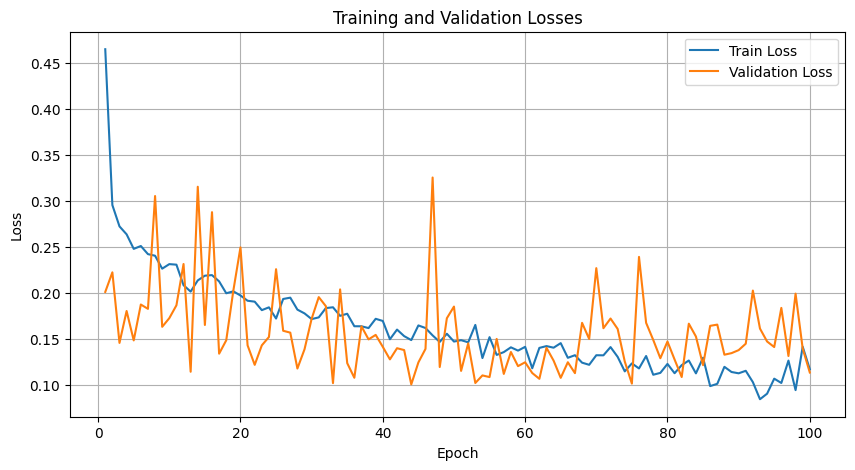

In [289]:
# Plot training and validation losses
plt.figure(figsize=(10, 5))
plt.plot(range(1, EPOCHS + 1), train_losses, label='Train Loss')
plt.plot(range(1, EPOCHS + 1), valid_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.grid(True)
plt.show()

Classification Report:
               precision    recall  f1-score   support

      aspiny       0.97      0.92      0.95        76
       spiny       0.92      0.97      0.94        67

    accuracy                           0.94       143
   macro avg       0.94      0.95      0.94       143
weighted avg       0.95      0.94      0.94       143



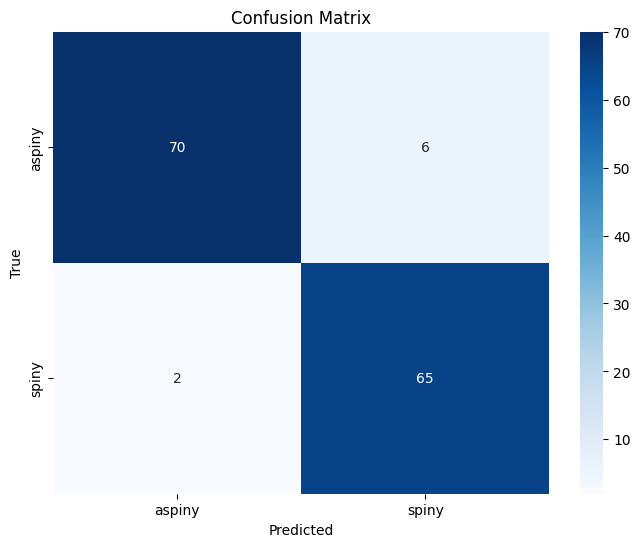

In [290]:
# Get predictions and true labels from the test set
y_pred_labels, y_true_labels = get_predictions(test_iterator, model, device)

# Classification report
print("Classification Report:\n", classification_report(y_true_labels, y_pred_labels, target_names=['aspiny', 'spiny']))

# Confusion matrix
conf_matrix = confusion_matrix(y_true_labels, y_pred_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['aspiny', 'spiny'], yticklabels=['aspiny', 'spiny'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

Classification Report (Entire Dataset):
               precision    recall  f1-score   support

      aspiny       0.98      0.95      0.96       724
       spiny       0.95      0.98      0.96       700

    accuracy                           0.96      1424
   macro avg       0.97      0.97      0.96      1424
weighted avg       0.97      0.96      0.96      1424



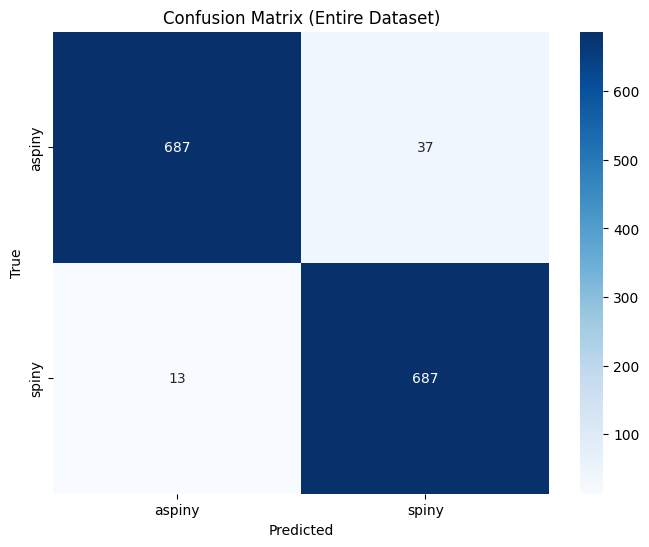

In [291]:
X_all = np.concatenate((X_train, X_valid, X_test), axis=0)
y_all = np.concatenate((y_train, y_valid, y_test), axis=0)
dataset = TabularDataset(X_all, y_all)
iterator = data.DataLoader(dataset, batch_size=BATCH_SIZE)

# Get predictions and true labels from the entire dataset
y_pred_labels_all, y_true_labels_all = get_predictions(iterator, model, device)

# Compute and print classification report
print("Classification Report (Entire Dataset):\n", classification_report(y_true_labels_all, y_pred_labels_all, target_names=['aspiny', 'spiny']))

# Confusion matrix
conf_matrix_all = confusion_matrix(y_true_labels_all, y_pred_labels_all)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_all, annot=True, fmt='d', cmap='Blues',
            xticklabels=['aspiny', 'spiny'], yticklabels=['aspiny', 'spiny'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Entire Dataset)')
plt.show()